#IMPORTATION DU MODELE YOLOV12 ET INSTALLATION DES DEPENDANCES

In [ ]:
!pip install ultralytics

In [ ]:
from ultralytics import YOLO
from IPython.display import Image

In [ ]:
import os

HOME = os.getcwd()
print(HOME)

/content


#IMPORTATION DES DONNEES DEPUIS ROBOFLOW

In [ ]:
!pip install roboflow

In [ ]:
from roboflow import Roboflow

rf = Roboflow(api_key="6UKxBil2BX6akeMfYUbJ")
project = rf.workspace("free-iebox").project("accident-z1fpf-cxigz")
version = project.version(2)
dataset = version.download("yolov12")


loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Accident-2 in yolov12:: 100%|██████████| 33840/33840 [00:13<00:00, 2421.52it/s]


In [ ]:
!ls {dataset.location}

data.yaml  README.dataset.txt  README.roboflow.txt  test  train  valid


In [ ]:
!sed -i '$d' {dataset.location}/data.yaml
!sed -i '$d' {dataset.location}/data.yaml
!sed -i '$d' {dataset.location}/data.yaml
!sed -i '$d' {dataset.location}/data.yaml
!echo -e "test: ../test/images\ntrain: ../train/images\nval: ../valid/images" >> {dataset.location}/data.yaml

In [ ]:
!cat {dataset.location}/data.yaml

train: ../train/images
val: ../valid/images
test: ../test/images

nc: 2
names: ['Accident', 'Non Accident']

roboflow:
  workspace: free-iebox
test: ../test/images
train: ../train/images
val: ../valid/images


In [ ]:
!results = model.train(data=f'{dataset.location}/data.yaml', epochs=50)

/bin/bash: -c: line 1: syntax error near unexpected token `('
/bin/bash: -c: line 1: `results = model.train(data=f'/content/Accident-2/data.yaml', epochs=50)'


In [ ]:
!model = YOLO("yolo12s.yaml")

/bin/bash: -c: line 1: syntax error near unexpected token `('
/bin/bash: -c: line 1: `model = YOLO("yolo12s.yaml")'


#Entrainement du modele YOLOv12

In [ ]:
#  Charger un modèle YOLOv12
model = YOLO("yolo12s.yaml")

#  Entraîner sur 50 époques
results = model.train(
    data=f"{dataset.location}/data.yaml",
    epochs=50,
    imgsz=640,
    batch=16,
    name="yolov12s_50epochs"
)

Ultralytics 8.3.174 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/Accident-2/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo12s.yaml, momentum=0.937, mosaic=1.0, multi_scale=False, name=yolov12s_50epochs, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=1

Overriding model.yaml nc=80 with nc=2

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  3                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
  4                  -1  1    103360  ultralytics.nn.modules.block.C3k2            [128, 256, 1, False, 0.25]    
  5                  -1  1    590336  ultralytics.nn.modules.conv.Conv             [256, 256, 3, 2]              
  6                  -1  2    689408  ultralytics.nn.modules.block.A2C2f           [256, 256, 2, True, 4]        
  7                  -1  1   1180672  ultralytics

 17                  -1  1    296704  ultralytics.nn.modules.block.A2C2f           [384, 256, 1, False, -1]      
 18                  -1  1    590336  ultralytics.nn.modules.conv.Conv             [256, 256, 3, 2]              
 19             [-1, 8]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           
 20                  -1  1   1511424  ultralytics.nn.modules.block.C3k2            [768, 512, 1, True]           
 21        [14, 17, 20]  1    820182  ultralytics.nn.modules.head.Detect           [2, [128, 256, 512]]          
YOLO12s summary: 272 layers, 9,253,910 parameters, 9,253,894 gradients, 21.5 GFLOPs

Freezing layer 'model.21.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks...


AMP: checks passed ✅
train: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1446.6±620.9 MB/s, size: 85.6 KB)


train: Scanning /content/Accident-2/train/labels... 13926 images, 2 backgrounds, 0 corrupt: 100%|██████████| 13926/13926 [00:06<00:00, 2291.36it/s]


train: New cache created: /content/Accident-2/train/labels.cache
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 26, len(boxes) = 17710. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 850.8±270.0 MB/s, size: 93.3 KB)


val: Scanning /content/Accident-2/valid/labels... 1991 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1991/1991 [00:01<00:00, 1378.05it/s]

val: New cache created: /content/Accident-2/valid/labels.cache


WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 7, len(boxes) = 2480. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
Plotting labels to runs/detect/yolov12s_50epochs/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: SGD(lr=0.01, momentum=0.9) with parameter groups 113 weight(decay=0.0), 120 weight(decay=0.0005), 119 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/yolov12s_50epochs
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      5.91G      3.163      4.276      4.235         15        640: 100%|██████████| 871/871 [06:39<00:00,  2.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:27<00:00,  2.25it/s]


                   all       1991       2480    0.00154      0.341    0.00287   0.000887

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50       6.7G      2.696      3.404      3.435         13        640: 100%|██████████| 871/871 [06:29<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:25<00:00,  2.46it/s]


                   all       1991       2480     0.0825      0.136     0.0663     0.0215

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      6.72G      2.018      2.649      2.571         11        640: 100%|██████████| 871/871 [06:25<00:00,  2.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:24<00:00,  2.57it/s]


                   all       1991       2480      0.182      0.179        0.1     0.0334

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      6.76G      1.872      2.432      2.373         16        640: 100%|██████████| 871/871 [06:23<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:24<00:00,  2.55it/s]


                   all       1991       2480      0.309      0.365      0.268      0.114

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      6.79G      1.775       2.27      2.261         12        640: 100%|██████████| 871/871 [06:23<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:24<00:00,  2.62it/s]


                   all       1991       2480      0.383      0.349       0.32      0.144

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      6.82G      1.728      2.173      2.191         16        640: 100%|██████████| 871/871 [06:22<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:24<00:00,  2.61it/s]


                   all       1991       2480      0.453      0.447       0.41      0.185

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      6.83G      1.702      2.097      2.154         10        640: 100%|██████████| 871/871 [06:22<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:23<00:00,  2.67it/s]


                   all       1991       2480      0.488      0.498      0.449      0.215

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      6.87G      1.666      2.026      2.113         10        640: 100%|██████████| 871/871 [06:23<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:24<00:00,  2.61it/s]


                   all       1991       2480      0.504      0.456      0.457      0.223

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      6.89G      1.644      1.971       2.09         16        640: 100%|██████████| 871/871 [06:23<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:24<00:00,  2.61it/s]


                   all       1991       2480      0.551      0.554      0.545      0.273

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      6.92G      1.618      1.928      2.066         12        640: 100%|██████████| 871/871 [06:23<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:24<00:00,  2.58it/s]


                   all       1991       2480      0.537      0.541      0.522      0.267

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      6.93G      1.604      1.885      2.039         11        640: 100%|██████████| 871/871 [06:27<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:24<00:00,  2.53it/s]


                   all       1991       2480      0.596      0.589      0.612      0.313

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      6.97G      1.575      1.824       2.01         12        640: 100%|██████████| 871/871 [06:24<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:24<00:00,  2.61it/s]


                   all       1991       2480      0.626      0.613      0.646      0.358

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50         7G      1.562      1.784      1.996         10        640: 100%|██████████| 871/871 [06:23<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:24<00:00,  2.61it/s]


                   all       1991       2480      0.578       0.62      0.608      0.326

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      7.02G      1.542      1.758      1.981         12        640: 100%|██████████| 871/871 [06:24<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:24<00:00,  2.59it/s]


                   all       1991       2480      0.701       0.66      0.704      0.409

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      7.04G       1.52      1.701      1.947         10        640: 100%|██████████| 871/871 [06:25<00:00,  2.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:24<00:00,  2.61it/s]


                   all       1991       2480      0.683      0.641      0.699      0.395

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      7.08G      1.506      1.675      1.941         15        640: 100%|██████████| 871/871 [06:26<00:00,  2.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:24<00:00,  2.59it/s]


                   all       1991       2480      0.703      0.673      0.718      0.425

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50       7.1G      1.487       1.64      1.923         13        640: 100%|██████████| 871/871 [06:27<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:24<00:00,  2.59it/s]


                   all       1991       2480      0.714      0.657      0.717      0.417

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      7.12G      1.476       1.61      1.907         20        640: 100%|██████████| 871/871 [06:26<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:24<00:00,  2.58it/s]

                   all       1991       2480      0.705      0.677      0.732       0.44



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      7.14G      1.462      1.579      1.891         10        640: 100%|██████████| 871/871 [06:27<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:24<00:00,  2.59it/s]

                   all       1991       2480      0.763      0.681      0.773       0.48



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      7.18G      1.446      1.544      1.875         12        640: 100%|██████████| 871/871 [06:27<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:23<00:00,  2.64it/s]


                   all       1991       2480      0.761      0.713      0.779      0.486

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      7.21G      1.436      1.526      1.871         12        640: 100%|██████████| 871/871 [06:28<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:24<00:00,  2.58it/s]

                   all       1991       2480      0.722      0.759      0.775      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      7.23G      1.425      1.499      1.857         18        640: 100%|██████████| 871/871 [06:29<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:24<00:00,  2.57it/s]

                   all       1991       2480      0.754      0.742      0.779      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      7.25G      1.406      1.461      1.837         18        640: 100%|██████████| 871/871 [06:30<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:24<00:00,  2.57it/s]

                   all       1991       2480      0.758      0.763      0.807      0.511



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      7.28G      1.391      1.435      1.822         17        640: 100%|██████████| 871/871 [06:30<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:24<00:00,  2.58it/s]

                   all       1991       2480      0.787      0.764      0.804      0.503



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      7.31G      1.377      1.414      1.809         21        640: 100%|██████████| 871/871 [06:29<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:24<00:00,  2.54it/s]

                   all       1991       2480      0.719      0.798      0.817      0.529



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      7.34G      1.368      1.397      1.807         15        640: 100%|██████████| 871/871 [06:30<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:24<00:00,  2.57it/s]

                   all       1991       2480      0.784      0.774      0.827      0.536



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      7.35G      1.353      1.381       1.79         18        640: 100%|██████████| 871/871 [06:30<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:24<00:00,  2.56it/s]

                   all       1991       2480      0.794      0.796       0.83      0.539



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      7.38G      1.346      1.348      1.774         18        640: 100%|██████████| 871/871 [06:29<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:25<00:00,  2.49it/s]

                   all       1991       2480      0.824      0.792      0.851      0.569



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      6.21G      1.325      1.322      1.756         18        640: 100%|██████████| 871/871 [06:29<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:24<00:00,  2.58it/s]

                   all       1991       2480      0.793      0.792      0.853      0.571



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      6.21G      1.321      1.294      1.753         18        640: 100%|██████████| 871/871 [06:28<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:24<00:00,  2.57it/s]


                   all       1991       2480      0.787      0.813      0.858      0.566

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      6.21G      1.302      1.284      1.734         10        640: 100%|██████████| 871/871 [06:28<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:24<00:00,  2.61it/s]

                   all       1991       2480      0.795      0.828      0.866       0.58



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      6.21G      1.292      1.257      1.723         13        640: 100%|██████████| 871/871 [06:28<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:25<00:00,  2.51it/s]

                   all       1991       2480      0.817      0.808      0.865      0.587



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      6.21G      1.282      1.237      1.715          7        640: 100%|██████████| 871/871 [06:28<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:24<00:00,  2.57it/s]

                   all       1991       2480      0.808      0.835      0.872      0.589



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      6.21G      1.264      1.219      1.697         24        640: 100%|██████████| 871/871 [06:29<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:23<00:00,  2.65it/s]

                   all       1991       2480      0.843       0.82      0.882      0.606



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      6.21G      1.262      1.198      1.698         12        640: 100%|██████████| 871/871 [06:29<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:24<00:00,  2.57it/s]

                   all       1991       2480      0.822      0.844      0.885       0.61



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      6.21G      1.244      1.175      1.684         15        640: 100%|██████████| 871/871 [06:31<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:24<00:00,  2.59it/s]

                   all       1991       2480      0.839      0.831      0.883      0.603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      6.21G      1.234      1.152      1.669         13        640: 100%|██████████| 871/871 [06:30<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:24<00:00,  2.58it/s]

                   all       1991       2480       0.84      0.837      0.885       0.61



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      6.21G      1.221      1.143      1.661         17        640: 100%|██████████| 871/871 [06:30<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:25<00:00,  2.50it/s]

                   all       1991       2480      0.851       0.84      0.899      0.626



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      6.21G      1.204      1.118      1.643         14        640: 100%|██████████| 871/871 [06:30<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:24<00:00,  2.61it/s]

                   all       1991       2480      0.857      0.847      0.899      0.632



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      6.25G        1.2      1.102      1.635         12        640: 100%|██████████| 871/871 [06:30<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:24<00:00,  2.59it/s]

                   all       1991       2480      0.853      0.851      0.904      0.635


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      6.27G      1.119     0.8111      1.622          6        640: 100%|██████████| 871/871 [06:29<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:24<00:00,  2.61it/s]


                   all       1991       2480      0.874      0.843      0.906      0.647

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50       6.3G       1.08     0.7563      1.581          6        640: 100%|██████████| 871/871 [06:27<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:24<00:00,  2.58it/s]

                   all       1991       2480      0.883      0.848      0.911      0.655



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      6.32G      1.054      0.732      1.554          8        640: 100%|██████████| 871/871 [06:28<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:24<00:00,  2.55it/s]

                   all       1991       2480      0.877      0.862      0.916      0.663



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      6.35G      1.032     0.7037      1.529          7        640: 100%|██████████| 871/871 [06:28<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:24<00:00,  2.56it/s]


                   all       1991       2480      0.888       0.87      0.927      0.674

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      6.38G      1.009     0.6793      1.514          9        640: 100%|██████████| 871/871 [06:27<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:24<00:00,  2.61it/s]

                   all       1991       2480      0.903      0.861      0.927      0.683



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50       6.4G     0.9918     0.6623      1.494          7        640: 100%|██████████| 871/871 [06:27<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:24<00:00,  2.57it/s]

                   all       1991       2480      0.905      0.868      0.929      0.688



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      6.42G      0.971     0.6411      1.478          6        640: 100%|██████████| 871/871 [06:29<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:24<00:00,  2.57it/s]

                   all       1991       2480       0.89      0.873       0.93       0.69



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      6.46G     0.9474      0.619      1.457          6        640: 100%|██████████| 871/871 [06:30<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:24<00:00,  2.58it/s]

                   all       1991       2480      0.897      0.871      0.931      0.693



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      6.48G     0.9358     0.6077      1.439          8        640: 100%|██████████| 871/871 [06:29<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:24<00:00,  2.59it/s]

                   all       1991       2480      0.898       0.87      0.933      0.697



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      6.51G     0.9204     0.5992      1.431          5        640: 100%|██████████| 871/871 [06:29<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:24<00:00,  2.57it/s]

                   all       1991       2480      0.897      0.874      0.933      0.699



50 epochs completed in 5.739 hours.
Optimizer stripped from runs/detect/yolov12s_50epochs/weights/last.pt, 18.9MB
Optimizer stripped from runs/detect/yolov12s_50epochs/weights/best.pt, 18.9MB

Validating runs/detect/yolov12s_50epochs/weights/best.pt...
Ultralytics 8.3.174 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO12s summary (fused): 159 layers, 9,231,654 parameters, 0 gradients, 21.2 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:28<00:00,  2.19it/s]


                   all       1991       2480      0.898      0.874      0.933      0.699
              Accident       1968       2168      0.916      0.867      0.944       0.68
          Non Accident        158        312      0.879      0.881      0.922      0.718
Speed: 0.3ms preprocess, 7.7ms inference, 0.0ms loss, 2.1ms postprocess per image
Results saved to runs/detect/yolov12s_50epochs


#Evaluation du modele

In [ ]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"

!ls {HOME}/runs/detect/train3/

ls: cannot access '/content/runs/detect/train3/': No such file or directory


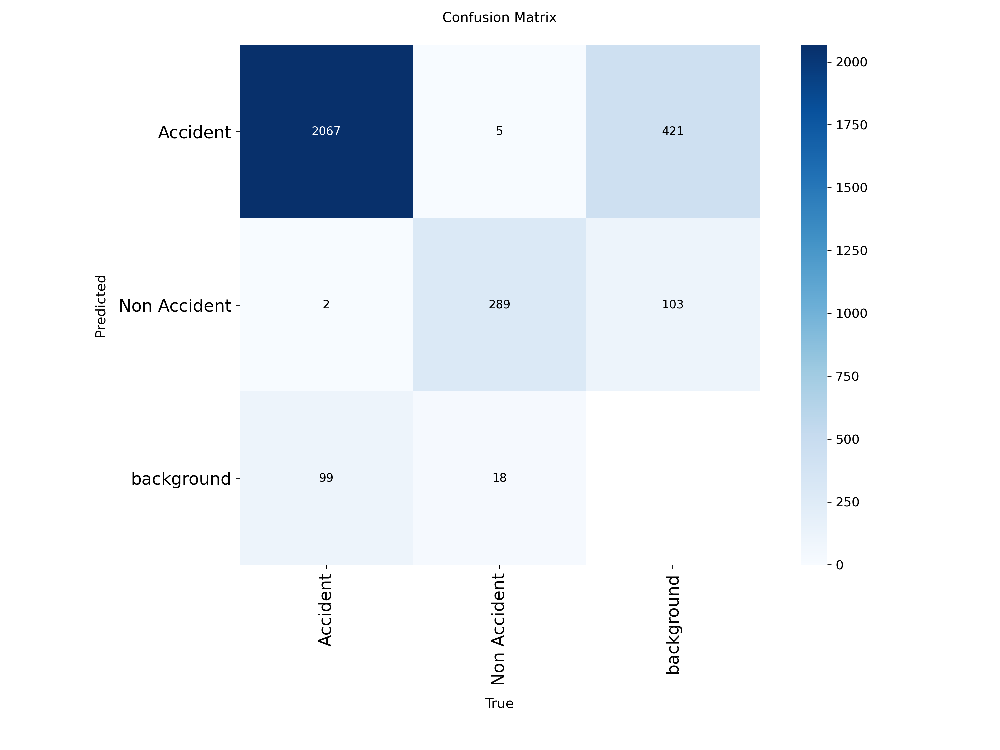

In [ ]:
#Afficher la matrice de confusion
Image(filename=f'{HOME}/runs/detect/yolov12s_50epochs/confusion_matrix.png', width=1000)

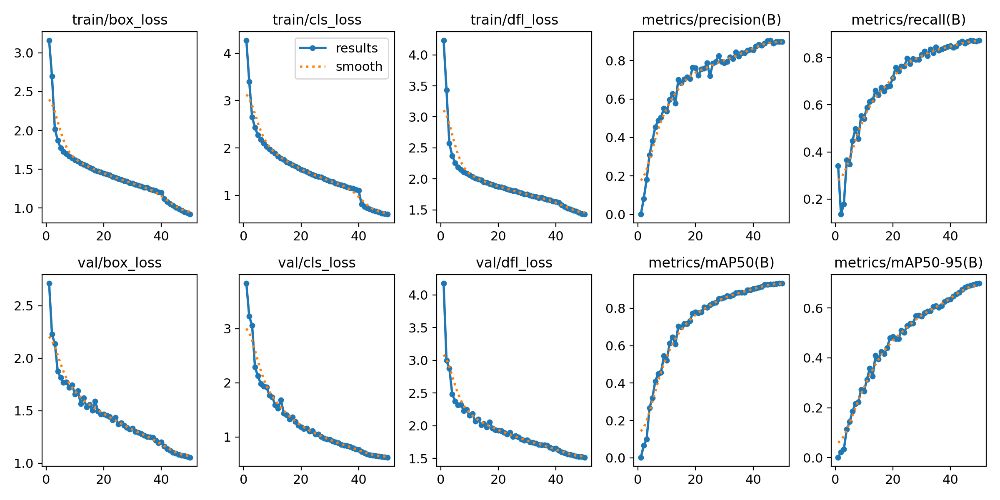

In [ ]:
#Resulats de l'entrainement
Image(filename=f'{HOME}/runs/detect/yolov12s_50epochs/results.png', width=1000)

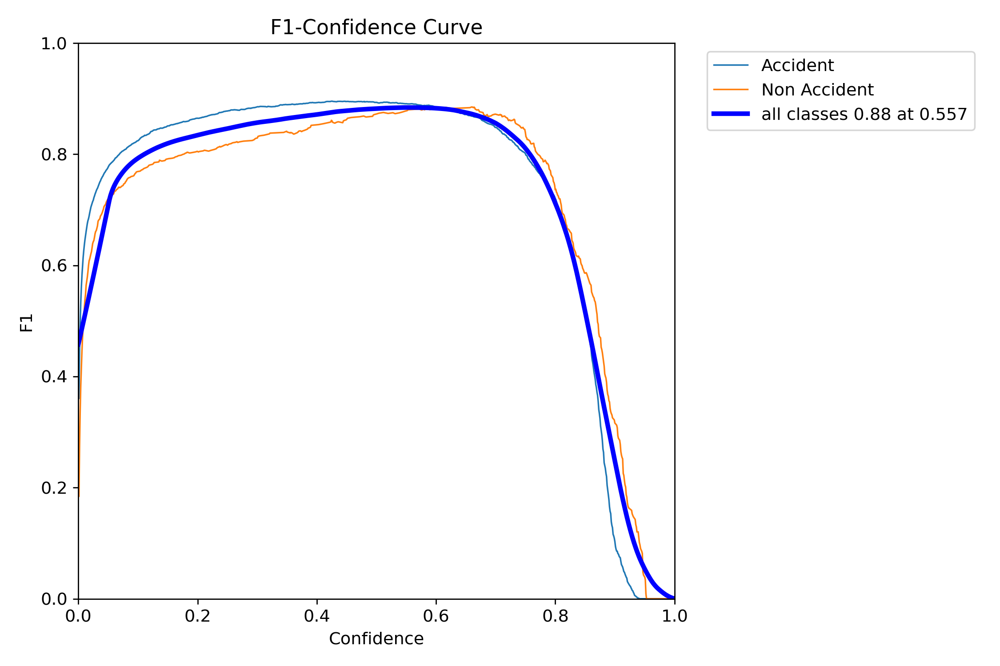

In [ ]:
#BoxF1_curve
Image(filename=f'{HOME}/runs/detect/yolov12s_50epochs/BoxF1_curve.png', width=1000)

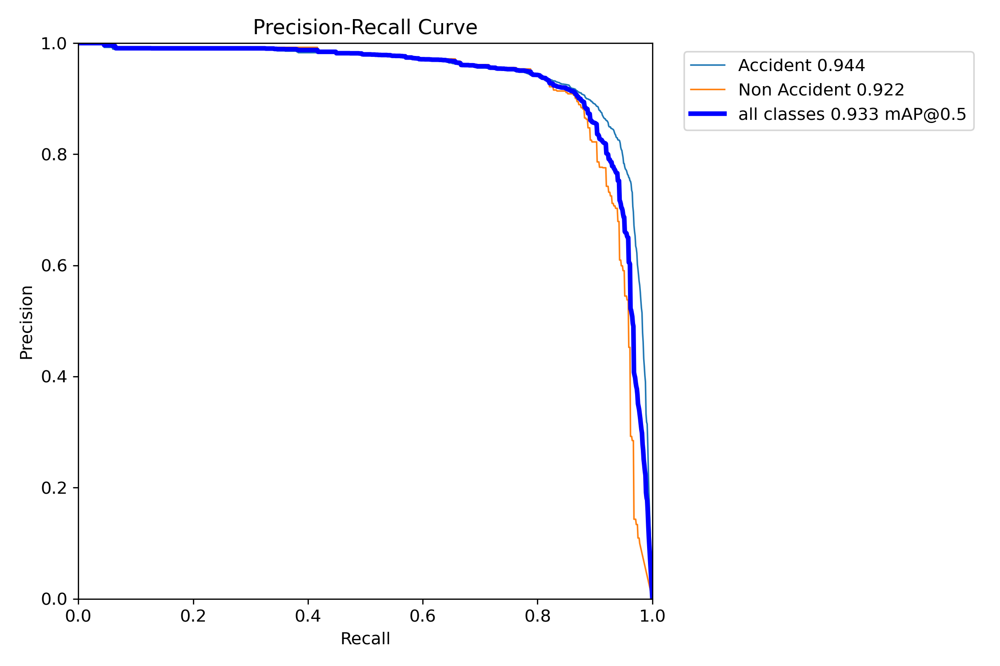

In [ ]:
#BoxPrecision
Image(filename=f'{HOME}/runs/detect/yolov12s_50epochs/BoxPR_curve.png', width=1000)

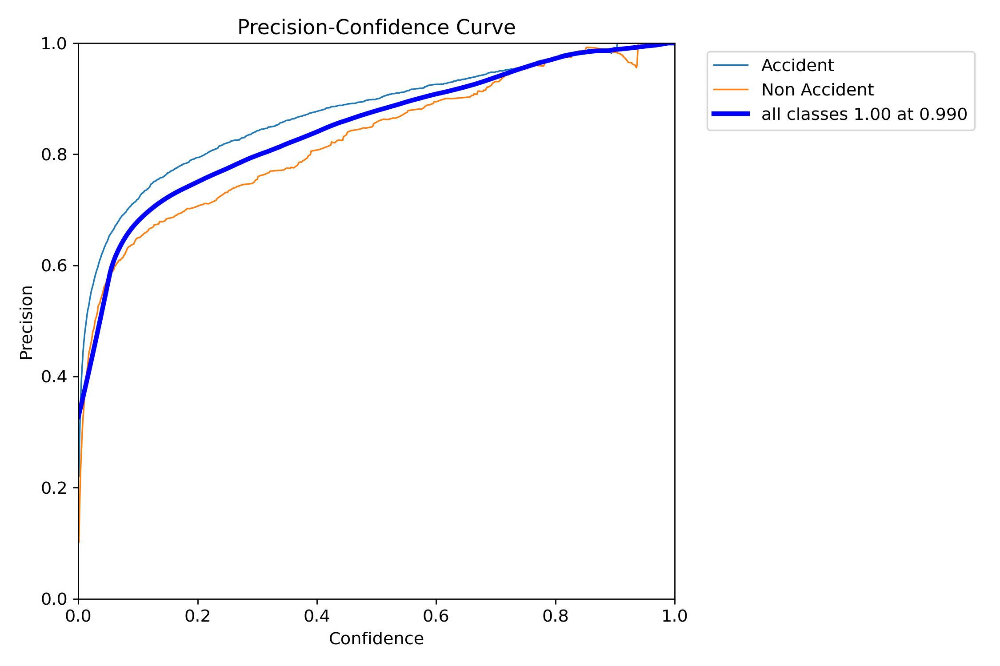

In [ ]:
Image(filename=f'{HOME}/runs/detect/yolov12s_50epochs/BoxP_curve.png', width=1000)

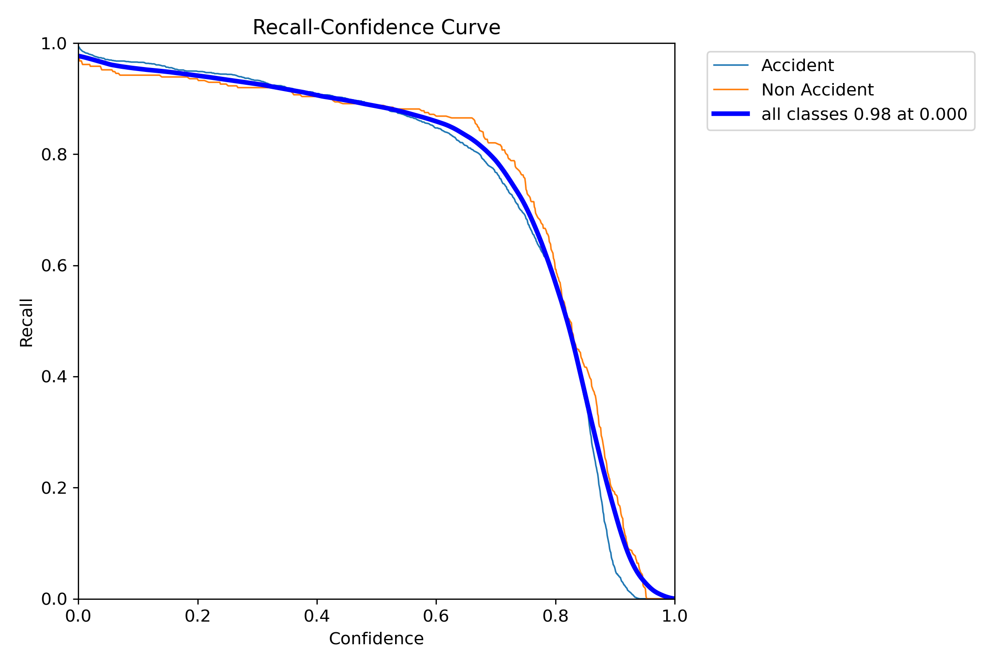

In [ ]:
Image(filename=f'{HOME}/runs/detect/yolov12s_50epochs/BoxR_curve.png', width=1000)

#Test du modele avec des images et videos d'entrées

In [ ]:
!pip install ultralytics
from ultralytics import YOLO
from IPython.display import Image

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 26.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 110.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 94.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 43.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 20.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 188.7/188.7 MB 6.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 107.7 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu1

In [ ]:
#!yolo detect predict model=runs/detect/train/weights/best.pt source="https://www.youtube.com/watch?v=NrZCVov7-Fo"

In [ ]:
import os
print(os.listdir('/content/'))

['.config', 'car accident1 .pt', 'car accident.pt', 'sample_data']


In [ ]:
model1 = YOLO("/content/car accident1 .pt")  # load a custom model

In [ ]:
!pip install roboflow

from roboflow import Roboflow

# Download the dataset again
rf = Roboflow(api_key="6UKxBil2BX6akeMfYUbJ")
project = rf.workspace("free-iebox").project("accident-z1fpf-cxigz")
version = project.version(2)
dataset = version.download("yolov12")

# Fix the data.yaml file again
!sed -i '$d' {dataset.location}/data.yaml
!sed -i '$d' {dataset.location}/data.yaml
!sed -i '$d' {dataset.location}/data.yaml
!sed -i '$d' {dataset.location}/data.yaml
!echo -e "test: ../test/images\ntrain: ../train/images\nval: ../valid/images" >> {dataset.location}/data.yaml

metrics = model1.val(data=f'{dataset.location}/data.yaml')  # specify the data path
metrics.box.map  # map50-95
metrics.box.map50  # map50
metrics.box.map75  # map75
metrics.box.maps  # a list contains map50-95 of each category

loading Roboflow workspace...
loading Roboflow project...
Ultralytics 8.3.179 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO12s summary (fused): 159 layers, 9,231,654 parameters, 0 gradients, 21.2 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1808.0±334.1 MB/s, size: 107.8 KB)


val: Scanning /content/Accident-2/valid/labels.cache... 1991 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1991/1991 [00:00<?, ?it/s]

WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 7, len(boxes) = 2480. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 125/125 [00:34<00:00,  3.65it/s]


                   all       1991       2480      0.898      0.874      0.934      0.699
              Accident       1968       2168      0.917      0.867      0.945       0.68
          Non Accident        158        312      0.879      0.881      0.922      0.718
Speed: 0.4ms preprocess, 13.1ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to runs/detect/val4


array([    0.68013,     0.71812])


===== Résumé des métriques globales =====


,Metric,Score
0,mAP@0.5:0.95,0.699125
1,mAP@0.5,0.933534
2,mAP@0.75,0.817361
3,Precision,0.898160
4,Recall,0.874054


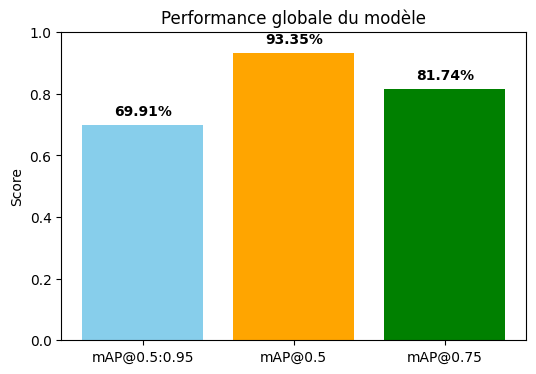

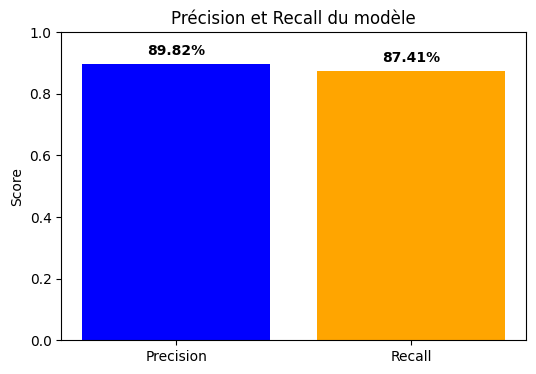

Could not get class names from dataset. Attempting to read from data.yaml...


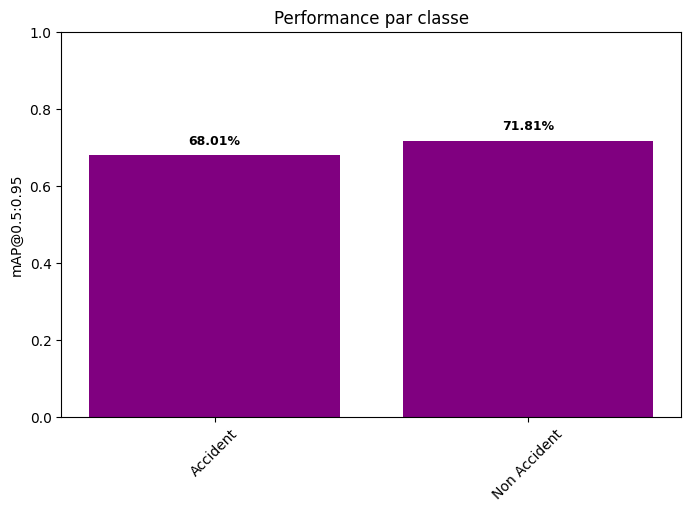

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import yaml

# Extraire toutes les métriques globales
map50_95 = metrics.box.map      # mAP@0.5:0.95
map50 = metrics.box.map50       # mAP@0.5
map75 = metrics.box.map75       # mAP@0.75
precision = metrics.box.p.mean() # moyenne précision
recall = metrics.box.r.mean()    # moyenne rappel
maps_per_class = metrics.box.maps

#  Tableau récapitulatif
summary_df = pd.DataFrame({
    "Metric": ["mAP@0.5:0.95", "mAP@0.5", "mAP@0.75", "Precision", "Recall"],
    "Score": [map50_95, map50, map75, precision, recall]
})
print("\n===== Résumé des métriques globales =====")
display(summary_df)

#  Graphique mAP global
plt.figure(figsize=(6,4))
bars = plt.bar(["mAP@0.5:0.95", "mAP@0.5", "mAP@0.75"],
               [map50_95, map50, map75], color=['skyblue', 'orange', 'green'])
plt.ylim(0, 1)
plt.ylabel("Score")
plt.title("Performance globale du modèle")
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, height + 0.02, f"{height:.2%}",
             ha='center', va='bottom', fontsize=10, fontweight='bold')
plt.show()

# Graphique Precision / Recall
plt.figure(figsize=(6,4))
bars = plt.bar(["Precision", "Recall"], [precision, recall], color=["blue", "orange"])
plt.ylim(0, 1)
plt.ylabel("Score")
plt.title("Précision et Recall du modèle")
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, height + 0.02, f"{height:.2%}",
             ha='center', va='bottom', fontsize=10, fontweight='bold')
plt.show()

#  mAP par classe
try:
    class_names = dataset.names
except AttributeError:
    print("Could not get class names from dataset. Attempting to read from data.yaml...")
    data_yaml_path = f'{dataset.location}/data.yaml'
    try:
        with open(data_yaml_path, 'r') as f:
            data_yaml = yaml.safe_load(f)
        class_names = data_yaml.get('names', [f"Classe {i}" for i in range(len(maps_per_class))])
    except (FileNotFoundError, KeyError):
        print(f"Could not read class names from {data_yaml_path}. Using generic class names.")
        class_names = [f"Classe {i}" for i in range(len(maps_per_class))]
except Exception as e:
    print(f"An unexpected error occurred while trying to get class names: {e}")
    class_names = [f"Classe {i}" for i in range(len(maps_per_class))]

if maps_per_class is not None and len(class_names) == len(maps_per_class):
    plt.figure(figsize=(8,5))
    bars = plt.bar(class_names, maps_per_class, color='purple')
    plt.ylim(0, 1)
    plt.ylabel("mAP@0.5:0.95")
    plt.title("Performance par classe")
    plt.xticks(rotation=45)
    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2, height + 0.02, f"{height:.2%}",
                 ha='center', va='bottom', fontsize=9, fontweight='bold')
    plt.show()
elif maps_per_class is not None:
    print("Could not plot mAP per class. Number of class names does not match the number of maps per class from metrics.")
else:
    print("Could not plot mAP per class. metrics.box.maps is not available.")



image 1/1 /content/accident1.jpg: 640x640 1 Accident, 20.9ms
Speed: 3.7ms preprocess, 20.9ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)
{0: 'Accident', 1: 'Non Accident'}
ultralytics.engine.results.Boxes object with attributes:

cls: tensor([0.], device='cuda:0')
conf: tensor([0.7964], device='cuda:0')
data: tensor([[1.3906e+00, 3.2993e+02, 1.0540e+03, 1.0341e+03, 7.9636e-01, 0.0000e+00]], device='cuda:0')
id: None
is_track: False
orig_shape: (1065, 1080)
shape: torch.Size([1, 6])
xywh: tensor([[ 527.6841,  682.0249, 1052.5873,  704.1811]], device='cuda:0')
xywhn: tensor([[0.4886, 0.6404, 0.9746, 0.6612]], device='cuda:0')
xyxy: tensor([[   1.3906,  329.9344, 1053.9778, 1034.1155]], device='cuda:0')
xyxyn: tensor([[0.0013, 0.3098, 0.9759, 0.9710]], device='cuda:0')


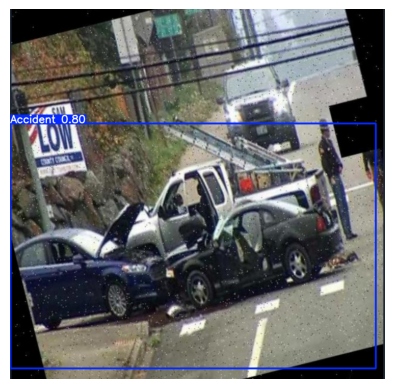

In [ ]:
import cv2

# Charger le modèle
model = YOLO("/content/car accident1 .pt")  # par ex: "runs/train/exp/weights/best.pt"

# Définir le chemin de l'image et la confiance
image_path = "/content/accident1.jpg"
confidence_threshold = 0.4  # change entre 0 et 1

# Lancer la prédiction avec le threshold choisi
results = model.predict(
    source=image_path,
    conf=confidence_threshold,
    save=False,  # si True, enregistre les images dans runs/predict
    imgsz=640
)

# Afficher les résultats
for result in results:
    print(result.names)   # noms des classes
    print(result.boxes)   # coordonnées et scores

# Récupérer et afficher l'image annotée
annotated_img = results[0].plot()  # image avec les bounding boxes
annotated_img = cv2.cvtColor(annotated_img, cv2.COLOR_BGR2RGB)  # conversion BGR → RGB pour plt
plt.imshow(annotated_img)
plt.axis("off")
plt.show()



image 1/1 /content/accident2.jpg: 448x640 1 Accident, 58.9ms
Speed: 3.6ms preprocess, 58.9ms inference, 1.6ms postprocess per image at shape (1, 3, 448, 640)
{0: 'Accident', 1: 'Non Accident'}
ultralytics.engine.results.Boxes object with attributes:

cls: tensor([0.], device='cuda:0')
conf: tensor([0.5934], device='cuda:0')
data: tensor([[7.5024e+00, 8.0201e+01, 1.0042e+03, 5.7829e+02, 5.9336e-01, 0.0000e+00]], device='cuda:0')
id: None
is_track: False
orig_shape: (721, 1080)
shape: torch.Size([1, 6])
xywh: tensor([[505.8731, 329.2433, 996.7415, 498.0847]], device='cuda:0')
xywhn: tensor([[0.4684, 0.4566, 0.9229, 0.6908]], device='cuda:0')
xyxy: tensor([[   7.5024,   80.2010, 1004.2439,  578.2856]], device='cuda:0')
xyxyn: tensor([[0.0069, 0.1112, 0.9299, 0.8021]], device='cuda:0')


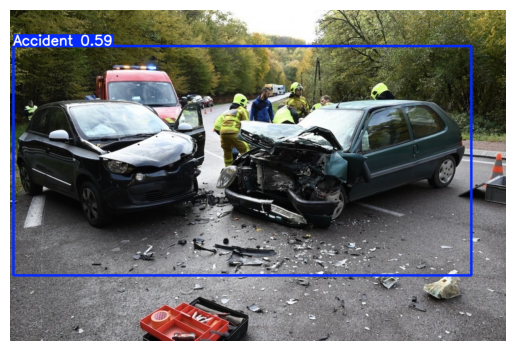

In [ ]:
# Définir le chemin de l'image et la confiance
image_path = "/content/accident2.jpg"
confidence_threshold = 0.4  # change entre 0 et 1

#Lancer la prédiction avec le threshold choisi
results = model.predict(
    source=image_path,
    conf=confidence_threshold,
    save=False,  # si True, enregistre les images dans runs/predict
    imgsz=640
)

# Afficher les résultats
for result in results:
    print(result.names)   # noms des classes
    print(result.boxes)   # coordonnées et scores

# Récupérer et afficher l'image annotée
annotated_img = results[0].plot()  # image avec les bounding boxes
annotated_img = cv2.cvtColor(annotated_img, cv2.COLOR_BGR2RGB)  # conversion BGR → RGB pour plt
plt.imshow(annotated_img)
plt.axis("off")
plt.show()


image 1/1 /content/accident3.jpg: 448x640 1 Accident, 16.6ms
Speed: 2.8ms preprocess, 16.6ms inference, 1.6ms postprocess per image at shape (1, 3, 448, 640)
{0: 'Accident', 1: 'Non Accident'}
ultralytics.engine.results.Boxes object with attributes:

cls: tensor([0.], device='cuda:0')
conf: tensor([0.2956], device='cuda:0')
data: tensor([[1.8002e+02, 3.2844e+02, 1.0403e+03, 6.0887e+02, 2.9556e-01, 0.0000e+00]], device='cuda:0')
id: None
is_track: False
orig_shape: (701, 1052)
shape: torch.Size([1, 6])
xywh: tensor([[610.1558, 468.6548, 860.2794, 280.4384]], device='cuda:0')
xywhn: tensor([[0.5800, 0.6686, 0.8178, 0.4001]], device='cuda:0')
xyxy: tensor([[ 180.0161,  328.4356, 1040.2955,  608.8740]], device='cuda:0')
xyxyn: tensor([[0.1711, 0.4685, 0.9889, 0.8686]], device='cuda:0')


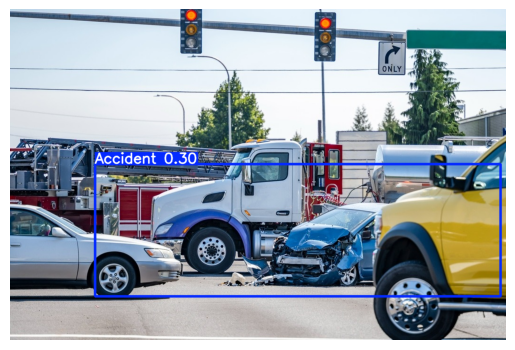

In [ ]:
# Définir le chemin de l'image et la confiance
image_path = "/content/accident3.jpg"
confidence_threshold = 0.2

# Lancer la prédiction avec le threshold choisi
results = model.predict(
    source=image_path,
    conf=confidence_threshold,
    save=False,  # si True, enregistre les images dans runs/predict
    imgsz=640
)

# Afficher les résultats
for result in results:
    print(result.names)   # noms des classes
    print(result.boxes)   # coordonnées et scores

# Récupérer et afficher l'image annotée
annotated_img = results[0].plot()  # image avec les bounding boxes
annotated_img = cv2.cvtColor(annotated_img, cv2.COLOR_BGR2RGB)  # conversion BGR → RGB pour plt
plt.imshow(annotated_img)
plt.axis("off")
plt.show()


image 1/1 /content/accident4.jpg: 544x640 1 Accident, 65.2ms
Speed: 3.2ms preprocess, 65.2ms inference, 1.8ms postprocess per image at shape (1, 3, 544, 640)
{0: 'Accident', 1: 'Non Accident'}
ultralytics.engine.results.Boxes object with attributes:

cls: tensor([0.], device='cuda:0')
conf: tensor([0.7606], device='cuda:0')
data: tensor([[  1.0560,  29.0190, 575.0969, 583.0000,   0.7606,   0.0000]], device='cuda:0')
id: None
is_track: False
orig_shape: (583, 719)
shape: torch.Size([1, 6])
xywh: tensor([[288.0764, 306.0095, 574.0409, 553.9810]], device='cuda:0')
xywhn: tensor([[0.4007, 0.5249, 0.7984, 0.9502]], device='cuda:0')
xyxy: tensor([[  1.0560,  29.0190, 575.0969, 583.0000]], device='cuda:0')
xyxyn: tensor([[0.0015, 0.0498, 0.7999, 1.0000]], device='cuda:0')


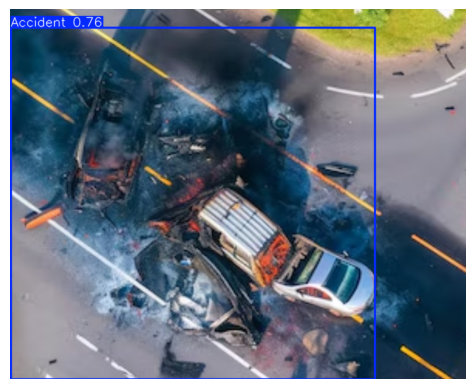

In [ ]:
# Définir le chemin de l'image et la confiance
image_path = "/content/accident4.jpg"
confidence_threshold = 0.2

# Lancer la prédiction avec le threshold choisi
results = model.predict(
    source=image_path,
    conf=confidence_threshold,
    save=False,
    imgsz=640
)

# Afficher les résultats
for result in results:
    print(result.names)   # noms des classes
    print(result.boxes)   # coordonnées et scores

# Récupérer et afficher l'image annotée
annotated_img = results[0].plot()  # image avec les bounding boxes
annotated_img = cv2.cvtColor(annotated_img, cv2.COLOR_BGR2RGB)  # conversion BGR → RGB pour plt
plt.imshow(annotated_img)
plt.axis("off")
plt.show()


image 1/1 /content/accident2.jpg: 448x640 1 Accident, 73.5ms
Speed: 3.1ms preprocess, 73.5ms inference, 9.0ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs/detect/predict3


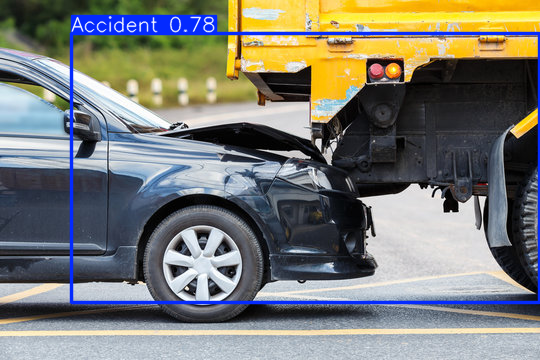

In [ ]:
# Charger le modèle
model_path = '/content' # Corrected file path

if not os.path.exists(model_path):
    print(f"Error: Model file not found at {model_path}.")
else:
    model = YOLO(model_path)

    # Faire la prédiction (avec sauvegarde dans runs/predict)
    results = model.predict(source="/content/accident2.jpg", save=True)

    # Récupérer l'image annotée depuis le premier résultat
    # Check if results list is not empty and has a plot method
    if results and hasattr(results[0], 'plot'):
        annotated_img = results[0].plot()[:, :, ::-1]  # BGR → RGB
        annotated_img_pil = Image.fromarray(annotated_img)

        # Afficher dans le notebook
        display(annotated_img_pil)

        # Sauvegarder localement avec un nom spécifique
        annotated_img_pil.save("/content/prediction.jpg")
    else:
        print("Prediction did not produce a plottable result.")

In [ ]:
#  Importations
from google.colab import files
from IPython.display import Video, display
import ipywidgets as widgets
from IPython.display import clear_output


# Charger le modèle YOLOv12

model_path = "/content/car accident1 .pt"  # <-- changer selon ton modèle
model = YOLO(model_path)

# Upload vidéo
print("Sélectionnez une vidéo à uploader")
uploaded = files.upload()
video_path = list(uploaded.keys())[0]

# Slider pour le threshold de confiance
confidence_slider = widgets.FloatSlider(
    value=0.4,
    min=0.1,
    max=1.0,
    step=0.05,
    description='Confidence:',
    continuous_update=False
)
display(confidence_slider)

# Bouton pour lancer l’inférence
button = widgets.Button(description=" Traiter la vidéo")

output = widgets.Output()
display(button, output)

def process_video(b):
    clear_output(wait=True)
    display(confidence_slider, button, output)
    conf = confidence_slider.value
    print(f"Traitement de la vidéo avec un seuil de confiance = {conf} ...")

    # Utiliser la fonction intégrée YOLO pour traiter la vidéo
    results = model.predict(
        source=video_path,
        conf=conf,
        imgsz=640,
        save=True  # sauvegarde automatique dans runs/detect/predict
    )

    # Récupérer le chemin de la vidéo générée
    output_video = results[0].path
    print(f" Vidéo traitée : {output_video}")

    # Afficher la vidéo
    display(Video(output_video, embed=True))

button.on_click(process_video)


FloatSlider(value=0.4, continuous_update=False, description='Confidence:', max=1.0, min=0.1, step=0.05)

Button(description=' Traiter la vidéo', style=ButtonStyle())

Output()

Traitement de la vidéo avec un seuil de confiance = 0.4 ...

WARNING ⚠️ 
inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/2145) /content/test_accident (2).mp4: 640x384 1 Accident, 30.6ms
video 1/1 (frame 2/2145) /content/test_accident (2).mp4: 640x384 1 Accident, 14.9ms
video 1/1 (frame 3/2145) /content/test_accident (2).mp4: 640x384 1 Accident, 13.7ms
video 1/1 (frame 4/2145) /content/test_accident (2).mp4: 640x384 1 Accident, 14.8ms
video 1/1 (frame 5/2145) /content/test_accident (2).mp4: 640